In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_excel("C:/Users/aarsh/OneDrive/Desktop/train.xlsx")

In [3]:
df.head()

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,target
0,-70.0,-61.0,-66.0,-53.0,-51.0,-63.0,-82.0,-57.0,-76.0,-78.0,-66.0,-66.0,-61.0,-59.0,-73.0,-75.0,-63.0,-77.0,B37
1,-77.0,-74.0,-71.0,-76.0,-65.0,-63.0,-66.0,-52.0,-55.0,-75.0,-72.0,-75.0,-74.0,-61.0,-64.0,-63.0,-53.0,-63.0,B61
2,-53.0,-38.0,-55.0,-66.0,-62.0,-62.0,-65.0,-70.0,-62.0,-52.0,-56.0,-53.0,-66.0,-68.0,-72.0,-60.0,-68.0,-77.0,A19
3,-72.0,-62.0,-59.0,-65.0,-65.0,-65.0,-78.0,-82.0,-83.0,-59.0,-84.0,-60.0,-64.0,-83.0,-69.0,-72.0,-95.0,-73.0,A22
4,-67.0,-69.0,-65.0,-63.0,-59.0,-53.0,-70.0,-72.0,-71.0,-60.0,-61.0,-57.0,-54.0,-76.0,-61.0,-66.0,-71.0,-80.0,A33


In [4]:
target_column = 'target'  

In [9]:
# Check for null values
print(df.isnull().sum())

# Handle missing values (e.g., fill with the mean)
df.fillna(df.mean(), inplace=True)

# Drop the target column
df_numeric = df.drop(columns=[target_column])


T1        0
T2        0
T3        0
T4        0
T5        0
T6        0
T7        0
T8        0
T9        0
T10       0
T11       0
T12       0
T13       0
T14       0
T15       0
T16       0
T17       0
T18       0
target    0
dtype: int64


C:\Users\aarsh\AppData\Local\Temp\ipykernel_13436\3530060429.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.fillna(df.mean(), inplace=True)


In [10]:
# Check the columns to ensure numeric selection
print(df_numeric.dtypes)

T1     float64
T2     float64
T3     float64
T4     float64
T5     float64
T6     float64
T7     float64
T8     float64
T9     float64
T10    float64
T11    float64
T12    float64
T13    float64
T14    float64
T15    float64
T16    float64
T17    float64
T18    float64
dtype: object


In [11]:
# Standardize the data
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_numeric)


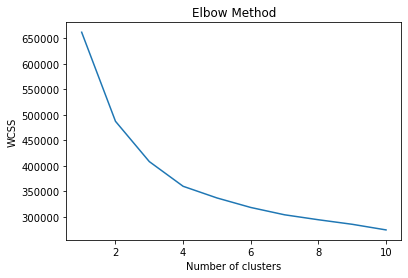

In [12]:
# Determine the number of clusters (k) using the Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

# Plot the results
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [13]:
# Apply K-means clustering (assuming k=3 from the Elbow method)
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
clusters = kmeans.fit_predict(df_scaled)

In [14]:
# Add cluster labels to the original dataframe
df['Cluster'] = clusters

# Function to classify new data points
def classify_new_data_point(new_data):
    new_data_scaled = scaler.transform([new_data])
    cluster = kmeans.predict(new_data_scaled)
    return cluster[0]

# Function to explain cluster assignment
def explain_cluster_assignment(new_data):
    new_data_scaled = scaler.transform([new_data])
    distances = kmeans.transform(new_data_scaled)
    assigned_cluster = kmeans.predict(new_data_scaled)[0]
    explanation = f'The new data point is closest to the centroid of cluster {assigned_cluster} with distances {distances[0]}.'
    return explanation

In [15]:
# Compute mean of features for each cluster
print(df.groupby('Cluster').mean())




                T1         T2         T3         T4         T5         T6  \
Cluster                                                                     
0       -60.063534 -59.774075 -64.680884 -69.465511 -71.108186 -70.557481   
1       -63.995680 -61.302889 -59.751451 -59.395302 -59.230593 -57.589847   
2       -72.045072 -71.513181 -70.024043 -69.153150 -65.827909 -64.841515   

                T7         T8         T9        T10        T11        T12  \
Cluster                                                                     
0       -76.251916 -78.585805 -77.235810 -59.186049 -61.452960 -65.171498   
1       -65.427636 -66.466586 -66.541582 -62.300797 -61.912245 -61.002700   
2       -62.447082 -58.385620 -56.685659 -73.715346 -72.942636 -72.993738   

               T13        T14        T15        T16        T17        T18  
Cluster                                                                    
0       -67.048984 -74.425303 -72.883817 -75.263023 -76.827280 -78.175164  


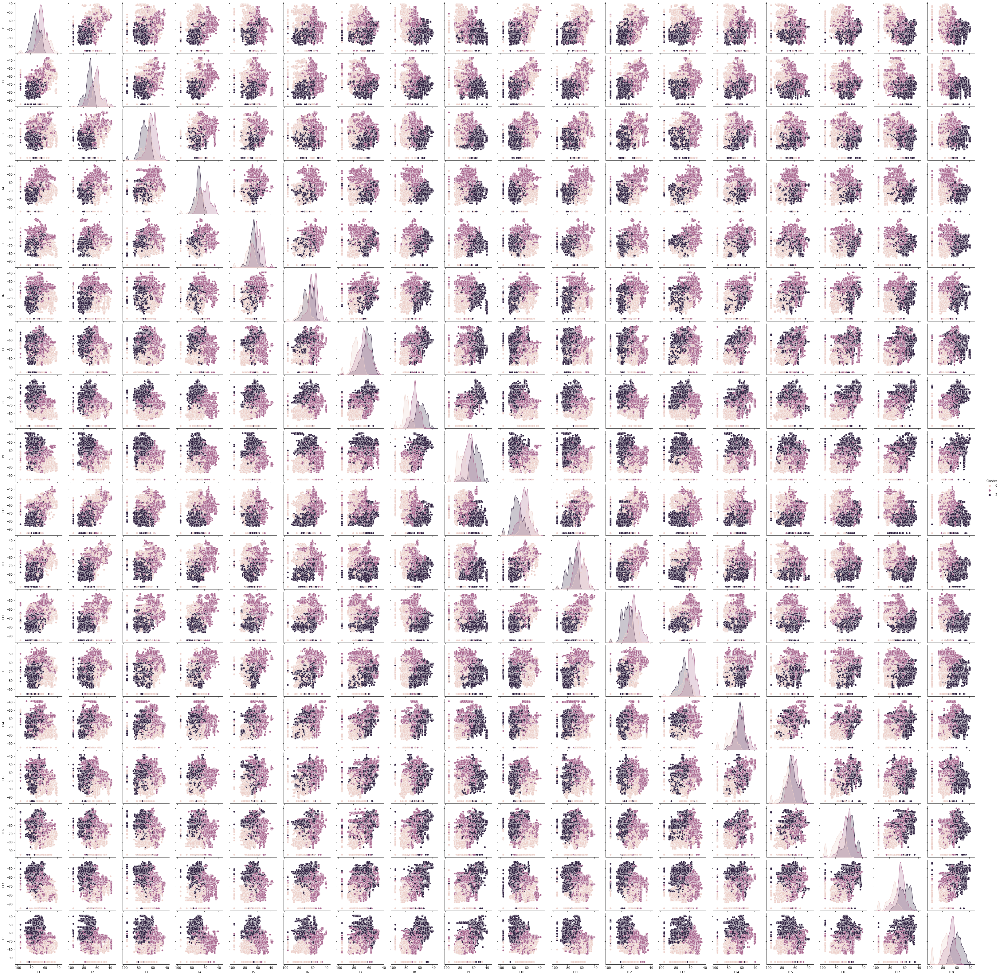

In [16]:
# Visualize clusters (if applicable)
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Cluster')
plt.show()

In [18]:
# Example usage
new_data_point = df_numeric.iloc[0].tolist()  # Example: Using the first row as a new data point
print(f'The new data point belongs to cluster: {classify_new_data_point(new_data_point)}')
print(explain_cluster_assignment(new_data_point))

The new data point belongs to cluster: 1
The new data point is closest to the centroid of cluster 1 with distances [5.08757525 3.88270777 5.12188972].


C:\Users\aarsh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\aarsh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [20]:
# Load the test dataset
df_test = pd.read_excel("C:/Users/aarsh/OneDrive/Desktop/test.xlsx")

# Handle missing values in test data
df_test.fillna(df_test.mean(), inplace=True)

# Drop the target column if it exists in the test dataset
df_test_features = df_test.drop(columns=[target_column], errors='ignore')  # Use errors='ignore' if target column is not in test dataset



     T1    T2    T3    T4    T5    T6    T7    T8    T9   T10   T11   T12  \
0 -76.0 -83.0 -70.0 -66.0 -64.0 -72.0 -64.0 -69.0 -60.0 -76.0 -83.0 -78.0   
1 -58.0 -57.0 -78.0 -81.0 -73.0 -73.0 -78.0 -78.0 -82.0 -49.0 -55.0 -58.0   
2 -70.0 -70.0 -71.0 -69.0 -69.0 -68.0 -61.0 -55.0 -53.0 -82.0 -87.0 -76.0   
3 -71.0 -61.0 -56.0 -56.0 -61.0 -60.0 -68.0 -66.0 -72.0 -58.0 -55.0 -56.0   
4 -72.0 -71.0 -64.0 -69.0 -64.0 -63.0 -61.0 -42.0 -55.0 -61.0 -69.0 -67.0   

    T13   T14   T15   T16   T17   T18  Cluster  
0 -81.0 -81.0 -81.0 -70.0 -60.0 -60.0        2  
1 -66.0 -79.0 -72.0 -83.0 -74.0 -80.0        0  
2 -68.0 -57.0 -64.0 -75.0 -57.0 -70.0        2  
3 -58.0 -62.0 -61.0 -59.0 -64.0 -65.0        1  
4 -63.0 -63.0 -55.0 -49.0 -49.0 -57.0        2  


In [21]:
# Select numeric columns
df_test_numeric = df_test_features.select_dtypes(include=[np.number])

# Standardize the test data using the same scaler
df_test_scaled = scaler.transform(df_test_numeric)

# Predict cluster labels for the test dataset
clusters_test = kmeans.predict(df_test_scaled)

# Add cluster labels to the test dataframe
df_test['Cluster'] = clusters_test

# Display the test dataset with cluster labels
print(df_test.head())

     T1    T2    T3    T4    T5    T6    T7    T8    T9   T10   T11   T12  \
0 -76.0 -83.0 -70.0 -66.0 -64.0 -72.0 -64.0 -69.0 -60.0 -76.0 -83.0 -78.0   
1 -58.0 -57.0 -78.0 -81.0 -73.0 -73.0 -78.0 -78.0 -82.0 -49.0 -55.0 -58.0   
2 -70.0 -70.0 -71.0 -69.0 -69.0 -68.0 -61.0 -55.0 -53.0 -82.0 -87.0 -76.0   
3 -71.0 -61.0 -56.0 -56.0 -61.0 -60.0 -68.0 -66.0 -72.0 -58.0 -55.0 -56.0   
4 -72.0 -71.0 -64.0 -69.0 -64.0 -63.0 -61.0 -42.0 -55.0 -61.0 -69.0 -67.0   

    T13   T14   T15   T16   T17   T18  Cluster  
0 -81.0 -81.0 -81.0 -70.0 -60.0 -60.0        2  
1 -66.0 -79.0 -72.0 -83.0 -74.0 -80.0        0  
2 -68.0 -57.0 -64.0 -75.0 -57.0 -70.0        2  
3 -58.0 -62.0 -61.0 -59.0 -64.0 -65.0        1  
4 -63.0 -63.0 -55.0 -49.0 -49.0 -57.0        2  
